# 🌵 Desert Semantic Segmentation with SegFormer
## S.P.I.T. Hackathon - Problem Statement 1

**Model**: SegFormer (Hierarchical Transformer)  
**Backbone**: MiT-B0/B1/B2 (configurable)  
**Task**: 10-class semantic segmentation for UGV desert navigation

---

### 📊 Dataset Classes (10 categories):
- 0: Trees
- 1: Lush bushes
- 2: Dry grass
- 3: Dry bushes
- 4: Ground clutter
- 5: Flowers
- 6: Logs
- 7: Rocks
- 8: Landscape (general ground)
- 9: Sky

---

### 🎯 Key Features:
- ✅ Advanced augmentations (Color Jitter, Gamma, Gaussian Noise, Blur, Shadows, Fog, Contrast, Texture Mixup)
- ✅ Proper dataset formatting from raw images
- ✅ Optimized for Google Colab
- ✅ Comprehensive evaluation metrics
- ✅ Visualization and analysis

---
## 1. 🔧 Setup and Installation

In [1]:
# Check if running on Colab
try:
    import google.colab
    IN_COLAB = True
    print("✓ Running on Google Colab")
except:
    IN_COLAB = False
    print("✓ Running locally")

# Mount Google Drive if on Colab
if IN_COLAB:
    from google.colab import drive
    drive.mount('/content/drive')
    print("✓ Google Drive mounted")

✓ Running locally


In [2]:
from google.colab import drive
drive.mount('/content/drive')

ModuleNotFoundError: No module named 'google'

In [3]:
# Install required packages
!pip install -q transformers datasets evaluate accelerate
!pip install -q albumentations opencv-python-headless
!pip install -q pillow matplotlib seaborn scikit-learn tqdm

print("\n✓ All packages installed successfully!")


[notice] A new release of pip is available: 25.1.1 -> 26.0.1
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip is available: 25.1.1 -> 26.0.1
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip is available: 25.1.1 -> 26.0.1
[notice] To update, run: pip install --upgrade pip

✓ All packages installed successfully!


In [4]:
# Import libraries
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
import cv2
from PIL import Image
import json
from tqdm.auto import tqdm
import warnings
warnings.filterwarnings('ignore')

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader

from transformers import (
    SegformerImageProcessor,
    SegformerForSemanticSegmentation,
    TrainingArguments,
    Trainer
)
from datasets import Dataset as HFDataset, DatasetDict, Features, ClassLabel, Image as HFImage
import evaluate

import albumentations as A
from sklearn.model_selection import train_test_split

# Set random seeds
def set_seed(seed=42):
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True

set_seed(42)

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"\n✓ Using device: {device}")
if torch.cuda.is_available():
    print(f"  GPU: {torch.cuda.get_device_name(0)}")
    print(f"  Memory: {torch.cuda.get_device_properties(0).total_memory / 1e9:.2f} GB")


✓ Using device: cuda
  GPU: NVIDIA A100-PCIE-40GB
  Memory: 42.41 GB


---
## 2. 📁 Dataset Configuration and Path Setup

In [10]:
import os
folder = 'Untitled Folder'
if os.path.exists(folder):
    for f in os.listdir(folder):
        print(f)
else:
    print(f"Folder not found: {os.path.abspath(folder)}")
    print(f"Current directory: {os.getcwd()}")
    print(f"Contents here: {os.listdir('.')}")

Folder not found: /home/Untitled Folder/Untitled Folder
Current directory: /home/Untitled Folder
Contents here: ['Offroad_Segmentation_Training_Dataset.zip', 'Desert_Segmentation_SegFormer_Colab.ipynb', '.ipynb_checkpoints', 'outputs', 'models']


In [12]:
# Maybe it's actually a .tar or .tar.gz
!file Offroad_Segmentation_Training_Dataset.zip!python -c "import zipfile; z=zipfile.ZipFile('Offroad_Segmentation_Training_Dataset.zip'); z.extractall('./desert_dataset'); print('Done!')"

Offroad_Segmentation_Training_Dataset.zip: Zip archive data, at least v2.0 to extract, compression method=store


In [15]:
!python -c "import zipfile; z=zipfile.ZipFile('Offroad_Segmentation_Training_Dataset.zip'); z.extractall('./desert_dataset'); print('Done!')"

Done!


In [18]:
import zipfile

# # =============================================================================
# # CONFIGURATION - UPDATED FOR ZIP DATASET
# # =============================================================================

# if IN_COLAB:
#     # Path to your zip file in Drive
#     ZIP_PATH = Path('Untitled Folder/Offroad_Segmentation_Training_Dataset.zip')
#     # Extraction destination
#     DATA_ROOT = Path('/content/desert_dataset')

#     if ZIP_PATH.exists():
#         print(f"📦 Unzipping dataset from {ZIP_PATH}...")
#         with zipfile.ZipFile(ZIP_PATH, 'r') as zip_ref:
#             zip_ref.extractall(DATA_ROOT)
#         print("✓ Extraction complete")
#     else:
#         print(f"⚠️ Zip file not found at {ZIP_PATH}")
# else:
#     # Local path
#     DATA_ROOT = Path('/content/desert_dataset/Offroad_Segmentation_Training_Dataset')

DATA_ROOT = Path('./desert_dataset/Offroad_Segmentation_Training_Dataset')

# Try to auto-detect structure within extracted folder
# Based on common structures, checking for 'train/images'
if (DATA_ROOT / 'train').exists():
    TRAIN_IMAGES = DATA_ROOT / 'train' / 'Color_Images'
    TRAIN_MASKS = DATA_ROOT / 'train' / 'Segmentation'
else:
    # Fallback: list contents to help user identify paths
    print(f"Found in {DATA_ROOT}: {[d.name for d in DATA_ROOT.iterdir() if d.is_dir()]}")
    # Manual override if auto-detect fails:
    TRAIN_IMAGES = DATA_ROOT / 'train' / 'Color_Images'
    TRAIN_MASKS = DATA_ROOT / 'train' / 'Segmentation'

# Create output directories
OUTPUT_DIR = Path('/content/outputs' if IN_COLAB else './outputs')
MODEL_DIR = Path('/content/models' if IN_COLAB else './models')
OUTPUT_DIR.mkdir(exist_ok=True)
MODEL_DIR.mkdir(exist_ok=True)

print(f"\n✓ Data root: {DATA_ROOT}")
print(f"✓ Output directory: {OUTPUT_DIR}")
print(f"✓ Model directory: {MODEL_DIR}")



✓ Data root: desert_dataset/Offroad_Segmentation_Training_Dataset
✓ Output directory: outputs
✓ Model directory: models


In [17]:
from pathlib import Path

# No 'Untitled Folder/' prefix needed — you're already inside it
DATA_ROOT = Path('./desert_dataset/Offroad_Segmentation_Training_Dataset')

print(f"Exists: {DATA_ROOT.exists()}")
print(f"Contents: {[d.name for d in DATA_ROOT.iterdir()] if DATA_ROOT.exists() else 'NOT FOUND'}")

Exists: True
Contents: ['train', 'val']


In [19]:
print(DATA_ROOT)
print(f"✓ Train images: {TRAIN_IMAGES}")
print(f"✓ Train masks: {TRAIN_MASKS}")

desert_dataset/Offroad_Segmentation_Training_Dataset
✓ Train images: desert_dataset/Offroad_Segmentation_Training_Dataset/train/Color_Images
✓ Train masks: desert_dataset/Offroad_Segmentation_Training_Dataset/train/Segmentation


In [24]:
# Re-detect classes scanning ALL mask files to ensure completeness
def detect_dataset_classes_full(mask_files):
    print(f"🔍 Scanning all {len(mask_files)} masks for unique classes...")
    unique_ids = set()
    for path in tqdm(mask_files):
        m = np.array(Image.open(path))
        unique_ids.update(np.unique(m).tolist())

    sorted_ids = sorted(list(unique_ids))
    classes = [f"class_{id_val}" for id_val in sorted_ids]
    mapping = {id_val: i for i, id_val in enumerate(sorted_ids)}

    return classes, mapping

if 'mask_files' in locals() and len(mask_files) > 0:
    CLASSES, ID_MAPPING = detect_dataset_classes_full(mask_files)
    NUM_CLASSES = len(CLASSES)
    ID2LABEL = {i: label for i, label in enumerate(CLASSES)}
    LABEL2ID = {label: i for i, label in enumerate(CLASSES)}

    print(f"\n✓ Detected {NUM_CLASSES} unique classes across entire dataset.")
    print(f"✓ Value Mapping: {ID_MAPPING}")

    import matplotlib.cm as cm
    colors = (cm.get_cmap('tab20')(np.linspace(0, 1, NUM_CLASSES))[:, :3] * 255).astype(int)
    COLOR_MAP = {i: colors[i].tolist() for i in range(NUM_CLASSES)}


🔍 Scanning all 2857 masks for unique classes...


  0%|          | 0/2857 [00:00<?, ?it/s]


✓ Detected 10 unique classes across entire dataset.
✓ Value Mapping: {100: 0, 200: 1, 300: 2, 500: 3, 550: 4, 600: 5, 700: 6, 800: 7, 7100: 8, 10000: 9}


---
## 3. 🔍 Dataset Exploration and Format Conversion

In [25]:
# Explore dataset structure
def explore_dataset(images_dir, masks_dir):
    """Explore and validate dataset structure"""
    if not images_dir.exists():
        print(f"❌ Images directory not found: {images_dir}")
        return None, None

    if not masks_dir.exists():
        print(f"❌ Masks directory not found: {masks_dir}")
        return None, None

    # Get image files
    image_exts = ['*.png', '*.jpg', '*.jpeg', '*.PNG', '*.JPG']
    image_files = []
    for ext in image_exts:
        image_files.extend(list(images_dir.glob(ext)))
    image_files = sorted(image_files)

    # Get mask files
    mask_files = []
    for ext in image_exts:
        mask_files.extend(list(masks_dir.glob(ext)))
    mask_files = sorted(mask_files)

    print(f"\n{'='*60}")
    print("DATASET EXPLORATION")
    print(f"{'='*60}")
    print(f"\n📁 Images: {len(image_files)} files")
    print(f"📁 Masks: {len(mask_files)} files")

    if len(image_files) == 0 or len(mask_files) == 0:
        print("\n❌ No images or masks found!")
        return None, None

    # Check sample image
    sample_img = Image.open(image_files[0])
    print(f"\n📸 Sample image:")
    print(f"   Size: {sample_img.size} (W x H)")
    print(f"   Mode: {sample_img.mode}")

    # Check sample mask
    sample_mask = np.array(Image.open(mask_files[0]))
    print(f"\n🎭 Sample mask:")
    print(f"   Shape: {sample_mask.shape}")
    print(f"   Dtype: {sample_mask.dtype}")
    print(f"   Unique values: {np.unique(sample_mask)}")
    print(f"   Min: {sample_mask.min()}, Max: {sample_mask.max()}")

    # Check if masks are RGB (need conversion)
    if len(sample_mask.shape) == 3:
        print("\n⚠️ Masks are RGB - will need to extract class indices")

    return image_files, mask_files

# Explore the dataset
image_files, mask_files = explore_dataset(TRAIN_IMAGES, TRAIN_MASKS)


DATASET EXPLORATION

📁 Images: 2857 files
📁 Masks: 2857 files

📸 Sample image:
   Size: (960, 540) (W x H)
   Mode: RGB

🎭 Sample mask:
   Shape: (540, 960)
   Dtype: uint16
   Unique values: [  200   300   500   550   800  7100 10000]
   Min: 200, Max: 10000


In [26]:
def process_mask(mask_path):
    """Load and process mask using the dynamically detected ID_MAPPING"""
    mask = np.array(Image.open(mask_path))

    # Create a clean mask initialized with 0
    class_mask = np.zeros(mask.shape[:2], dtype=np.uint8)

    # Ensure ID_MAPPING exists before using it
    if 'ID_MAPPING' in globals():
        # Map the dataset IDs to our detected class indices
        for raw_id, class_idx in ID_MAPPING.items():
            class_mask[mask == raw_id] = class_idx
    else:
        print("⚠️ Error: ID_MAPPING not found. Please run the Class Detection cell (A-c56anMQgVV) first.")

    return class_mask

# Test mask processing with detected classes
if 'mask_files' in locals() and len(mask_files) > 0 and 'ID_MAPPING' in globals():
    test_mask = process_mask(mask_files[0])
    print(f"\n✓ Processed mask shape: {test_mask.shape}")
    print(f"✓ Processed mask dtype: {test_mask.dtype}")
    print(f"✓ Unique values: {np.unique(test_mask)}")


✓ Processed mask shape: (540, 960)
✓ Processed mask dtype: uint8
✓ Unique values: [1 2 3 4 7 8 9]


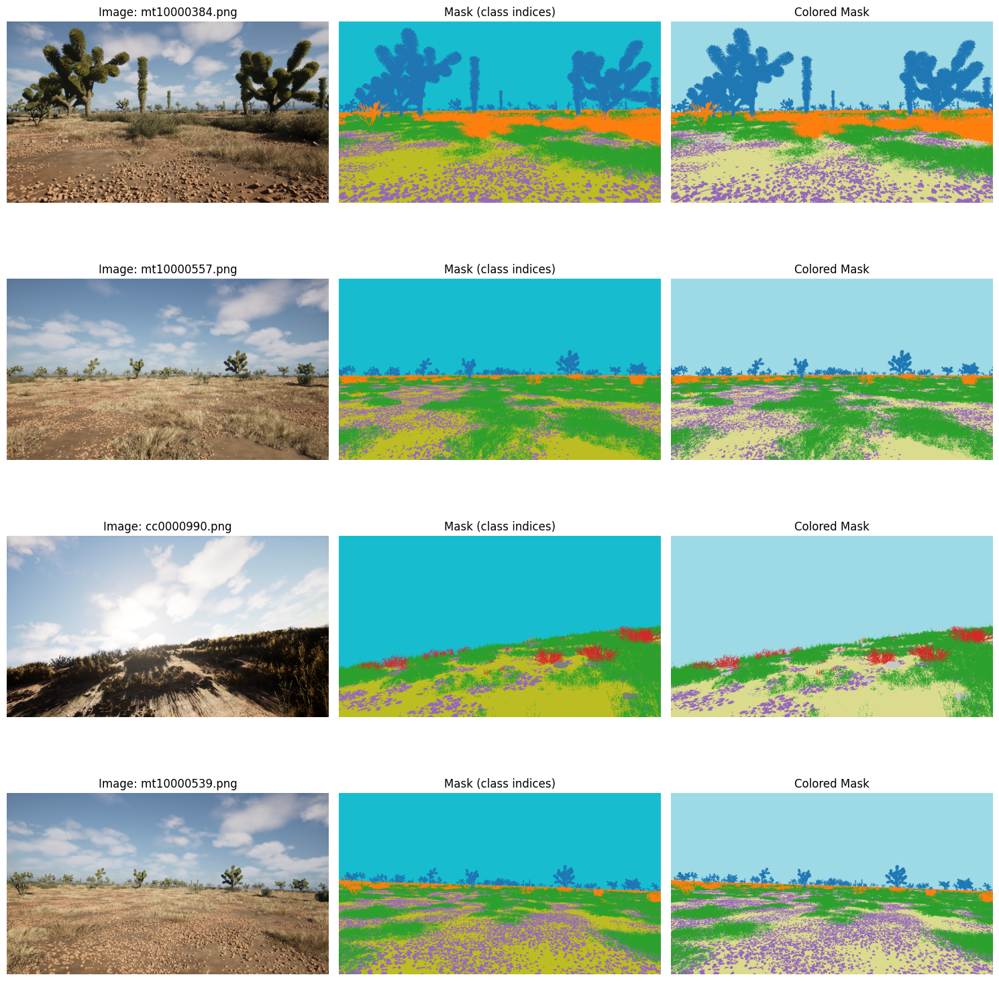

In [27]:
# Visualize sample images and masks
def visualize_samples(image_files, mask_files, num_samples=4):
    """Visualize random samples from dataset"""
    if not image_files or not mask_files:
        print("No data to visualize")
        return

    # Check for required variables from A-c56anMQgVV
    if 'NUM_CLASSES' not in globals() or 'COLOR_MAP' not in globals():
        print("☑ጱ Error: NUM_CLASSES or COLOR_MAP not found. Please run the Class Detection cell (A-c56anMQgVV) first.")
        return

    indices = np.random.choice(len(image_files), min(num_samples, len(image_files)), replace=False)

    fig, axes = plt.subplots(num_samples, 3, figsize=(15, 4 * num_samples))
    if num_samples == 1:
        axes = axes.reshape(1, -1)

    for idx, i in enumerate(indices):
        # Load image
        image = Image.open(image_files[i])
        axes[idx, 0].imshow(image)
        axes[idx, 0].set_title(f'Image: {image_files[i].name}')
        axes[idx, 0].axis('off')

        # Load and process mask
        mask = process_mask(mask_files[i])
        axes[idx, 1].imshow(mask, cmap='tab10', vmin=0, vmax=NUM_CLASSES-1)
        axes[idx, 1].set_title('Mask (class indices)')
        axes[idx, 1].axis('off')

        # Colored visualization
        colored_mask = np.zeros((*mask.shape, 3), dtype=np.uint8)
        for class_id, color in COLOR_MAP.items():
            colored_mask[mask == class_id] = color

        axes[idx, 2].imshow(colored_mask)
        axes[idx, 2].set_title('Colored Mask')
        axes[idx, 2].axis('off')

    plt.tight_layout()
    plt.savefig(OUTPUT_DIR / 'dataset_samples.png', dpi=150, bbox_inches='tight')
    plt.show()

# Visualize samples
if 'image_files' in locals() and 'mask_files' in locals():
    visualize_samples(image_files, mask_files, num_samples=4)

In [28]:
# Explicitly defining the detected classes from your dataset
import numpy as np
import matplotlib.cm as cm

# These are the 10 unique IDs found in your 2857 masks
ID_MAPPING = {100: 0, 200: 1, 300: 2, 500: 3, 550: 4, 600: 5, 700: 6, 800: 7, 7100: 8, 10000: 9}
CLASSES = [f'class_{val}' for val in sorted(ID_MAPPING.keys())]
NUM_CLASSES = len(CLASSES)

ID2LABEL = {i: label for i, label in enumerate(CLASSES)}
LABEL2ID = {label: i for i, label in enumerate(CLASSES)}

# Generate the color map for visualization
colors = (cm.get_cmap('tab20')(np.linspace(0, 1, NUM_CLASSES))[:, :3] * 255).astype(int)
COLOR_MAP = {i: colors[i].tolist() for i in range(NUM_CLASSES)}

print(f"\u2713 Variables initialized: NUM_CLASSES={NUM_CLASSES}")
print(f"\u2713 Ready for visualization and training.")

✓ Variables initialized: NUM_CLASSES=10
✓ Ready for visualization and training.


In [29]:
# Analyze a few masks to see all unique values present
unique_values = set()
for i in range(min(10, len(mask_files))):
    m = np.array(Image.open(mask_files[i]))
    unique_values.update(np.unique(m).tolist())

print(f"Unique values found in sample masks: {sorted(list(unique_values))}")
print(f"Expected number of classes: {NUM_CLASSES}")

Unique values found in sample masks: [200, 300, 500, 550, 800, 7100, 10000]
Expected number of classes: 10


---
## 4. 🎨 Advanced Data Augmentation Pipeline

### 📝 Reasoning for Augmentations:

**Why these specific augmentations?**

1. **Color Jitter**: Desert environments have varying lighting conditions throughout the day. This helps the model handle different sun angles and color temperatures.

2. **Gamma Change**: Simulates different exposure levels and helps with overexposed/underexposed scenarios common in outdoor environments.

3. **Gaussian Noise**: Adds robustness to sensor noise and low-quality camera inputs that UGVs might have.

4. **Blur**: Simulates motion blur from vehicle movement and helps with focus variations.

5. **Random Shadows**: Critical for desert scenes where shadows from rocks, vegetation, and terrain features are prominent.

6. **Fog**: Simulates dust storms and atmospheric haze common in desert environments.

7. **Contrast Shift**: Handles varying atmospheric conditions and helps with scene understanding in different contrast scenarios.

8. **Texture Mixup**: Creates novel texture combinations to prevent overfitting to specific terrain patterns and improves generalization.

**Why strong augmentation for synthetic data?**
- Synthetic data (digital twin) is more uniform than real-world
- Test set is from DIFFERENT environment - strong augmentation helps generalization
- Augmentation bridges the sim-to-real gap

In [30]:
# Custom augmentation: Random shadows
class RandomShadow(A.ImageOnlyTransform):
    """Add random shadow regions to simulate objects casting shadows"""

    def __init__(self, shadow_roi=(0.3, 0.7), num_shadows=3, always_apply=False, p=0.5):
        super().__init__(always_apply, p)
        self.shadow_roi = shadow_roi
        self.num_shadows = num_shadows

    def apply(self, img, **params):
        h, w = img.shape[:2]

        for _ in range(np.random.randint(1, self.num_shadows + 1)):
            # Random shadow dimensions
            shadow_h = int(h * np.random.uniform(*self.shadow_roi))
            shadow_w = int(w * np.random.uniform(*self.shadow_roi))

            # Random position
            top = np.random.randint(0, h - shadow_h)
            left = np.random.randint(0, w - shadow_w)

            # Random shadow intensity
            shadow_intensity = np.random.uniform(0.3, 0.7)

            # Apply shadow
            img[top:top+shadow_h, left:left+shadow_w] = \
                (img[top:top+shadow_h, left:left+shadow_w] * shadow_intensity).astype(np.uint8)

        return img

# Custom augmentation: Fog/Haze
class RandomFog(A.ImageOnlyTransform):
    """Add fog effect to simulate dust/haze in desert"""

    def __init__(self, fog_coef=(0.1, 0.4), always_apply=False, p=0.5):
        super().__init__(always_apply, p)
        self.fog_coef = fog_coef

    def apply(self, img, **params):
        h, w = img.shape[:2]

        # Random fog intensity
        fog_intensity = np.random.uniform(*self.fog_coef)

        # Create fog layer (slightly yellowish for desert dust)
        fog_color = np.array([240, 230, 210])  # Sandy fog color
        fog_layer = np.ones_like(img) * fog_color

        # Blend with original image
        img = cv2.addWeighted(img, 1 - fog_intensity, fog_layer.astype(np.uint8), fog_intensity, 0)

        return img

# Custom augmentation: Texture Mixup
class TextureMixup(A.DualTransform):
    """Mix textures from different regions to create diverse patterns"""

    def __init__(self, mix_ratio=(0.1, 0.3), always_apply=False, p=0.3):
        super().__init__(always_apply, p)
        self.mix_ratio = mix_ratio

    def apply(self, img, **params):
        h, w = img.shape[:2]

        # Create random texture patches
        mix_alpha = np.random.uniform(*self.mix_ratio)

        # Random crop from same image and blend
        crop_h = int(h * 0.5)
        crop_w = int(w * 0.5)
        top = np.random.randint(0, h - crop_h)
        left = np.random.randint(0, w - crop_w)

        texture_patch = img[top:top+crop_h, left:left+crop_w].copy()
        texture_patch = cv2.resize(texture_patch, (w, h))

        img = cv2.addWeighted(img, 1 - mix_alpha, texture_patch, mix_alpha, 0)

        return img

    def apply_to_mask(self, mask, **params):
        # Don't apply to mask
        return mask

print("✓ Custom augmentation classes defined")

✓ Custom augmentation classes defined


In [31]:
# Define comprehensive augmentation pipeline
train_augmentation = A.Compose([
    # 1. Color Jitter - varying lighting conditions
    A.ColorJitter(
        brightness=0.3,
        contrast=0.3,
        saturation=0.3,
        hue=0.1,
        p=0.7
    ),

    # 2. Gamma Change - exposure variations
    A.RandomGamma(
        gamma_limit=(70, 150),
        p=0.5
    ),

    # 3. Gaussian Noise - sensor noise
    A.GaussNoise(
        var_limit=(10.0, 80.0),
        mean=0,
        p=0.4
    ),

    # 4. Blur - motion blur and focus variations
    A.OneOf([
        A.MotionBlur(blur_limit=7, p=1.0),
        A.GaussianBlur(blur_limit=(3, 9), p=1.0),
        A.MedianBlur(blur_limit=7, p=1.0),
    ], p=0.4),

    # 5. Random Shadows - terrain shadows
    RandomShadow(
        shadow_roi=(0.2, 0.6),
        num_shadows=3,
        p=0.5
    ),

    # 6. Fog - dust storms and haze
    RandomFog(
        fog_coef=(0.1, 0.35),
        p=0.3
    ),

    # 7. Contrast Shift - atmospheric variations
    A.RandomBrightnessContrast(
        brightness_limit=0.25,
        contrast_limit=0.25,
        p=0.6
    ),

    # 8. Texture Mixup - diverse terrain patterns
    TextureMixup(
        mix_ratio=(0.1, 0.25),
        p=0.3
    ),

    # Additional augmentations for robustness
    A.HorizontalFlip(p=0.5),

    A.ShiftScaleRotate(
        shift_limit=0.1,
        scale_limit=0.15,
        rotate_limit=15,
        border_mode=cv2.BORDER_CONSTANT,
        value=0,
        mask_value=0,
        p=0.5
    ),

    A.CoarseDropout(
        max_holes=8,
        max_height=64,
        max_width=64,
        fill_value=0,
        mask_fill_value=0,
        p=0.3
    ),
])

# Validation augmentation (no augmentation, just ensure proper format)
val_augmentation = A.Compose([])

print("✓ Augmentation pipelines defined")
print(f"  - Training augmentations: {len(train_augmentation.transforms)}")
print(f"  - Validation augmentations: {len(val_augmentation.transforms)}")

✓ Augmentation pipelines defined
  - Training augmentations: 11
  - Validation augmentations: 0


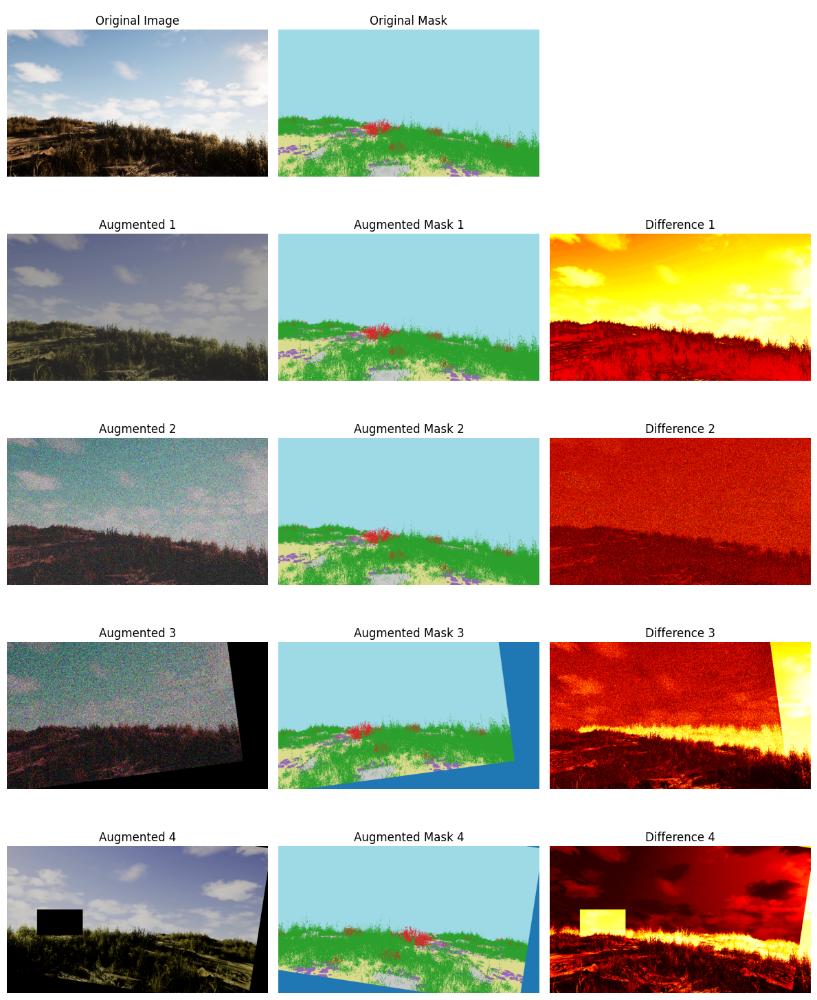

In [32]:
# Visualize augmentations
def visualize_augmentations(image_path, mask_path, augmentation, num_samples=4):
    """Visualize effect of augmentations"""
    # Load original
    image = np.array(Image.open(image_path))
    mask = process_mask(mask_path)

    fig, axes = plt.subplots(num_samples + 1, 3, figsize=(12, 3 * (num_samples + 1)))

    # Show original
    axes[0, 0].imshow(image)
    axes[0, 0].set_title('Original Image')
    axes[0, 0].axis('off')

    colored_mask = np.zeros((*mask.shape, 3), dtype=np.uint8)
    for class_id, color in COLOR_MAP.items():
        colored_mask[mask == class_id] = color

    axes[0, 1].imshow(colored_mask)
    axes[0, 1].set_title('Original Mask')
    axes[0, 1].axis('off')

    axes[0, 2].axis('off')

    # Show augmented versions
    for i in range(num_samples):
        augmented = augmentation(image=image, mask=mask)
        aug_image = augmented['image']
        aug_mask = augmented['mask']

        axes[i+1, 0].imshow(aug_image)
        axes[i+1, 0].set_title(f'Augmented {i+1}')
        axes[i+1, 0].axis('off')

        aug_colored_mask = np.zeros((*aug_mask.shape, 3), dtype=np.uint8)
        for class_id, color in COLOR_MAP.items():
            aug_colored_mask[aug_mask == class_id] = color

        axes[i+1, 1].imshow(aug_colored_mask)
        axes[i+1, 1].set_title(f'Augmented Mask {i+1}')
        axes[i+1, 1].axis('off')

        # Show difference
        diff = np.abs(aug_image.astype(float) - image.astype(float)).mean(axis=-1)
        axes[i+1, 2].imshow(diff, cmap='hot')
        axes[i+1, 2].set_title(f'Difference {i+1}')
        axes[i+1, 2].axis('off')

    plt.tight_layout()
    plt.savefig(OUTPUT_DIR / 'augmentation_examples.png', dpi=150, bbox_inches='tight')
    plt.show()

# Visualize augmentations on a sample
if image_files and mask_files:
    sample_idx = np.random.randint(0, len(image_files))
    visualize_augmentations(
        image_files[sample_idx],
        mask_files[sample_idx],
        train_augmentation,
        num_samples=4
    )

---
## 5. 📊 Create HuggingFace Dataset Format

In [33]:
# Prepare data for HuggingFace format
def prepare_dataset_dict(image_files, mask_files, test_size=0.2, val_size=0.1):
    """
    Prepare dataset in HuggingFace format with train/val/test splits

    Args:
        test_size: Proportion for test set (from total)
        val_size: Proportion for validation (from train after test split)
    """
    print("\n" + "="*60)
    print("PREPARING DATASET")
    print("="*60)

    # Ensure same number of images and masks
    assert len(image_files) == len(mask_files), "Mismatch between images and masks"

    # Create indices
    indices = list(range(len(image_files)))

    # Split: train+val / test
    train_val_idx, test_idx = train_test_split(
        indices, test_size=test_size, random_state=42
    )

    # Split train+val: train / val
    train_idx, val_idx = train_test_split(
        train_val_idx, test_size=val_size/(1-test_size), random_state=42
    )

    print(f"\n✓ Total samples: {len(indices)}")
    print(f"✓ Train samples: {len(train_idx)} ({len(train_idx)/len(indices)*100:.1f}%)")
    print(f"✓ Validation samples: {len(val_idx)} ({len(val_idx)/len(indices)*100:.1f}%)")
    print(f"✓ Test samples: {len(test_idx)} ({len(test_idx)/len(indices)*100:.1f}%)")

    # Create dataset dictionaries
    def create_split_dict(indices):
        return {
            'image': [str(image_files[i]) for i in indices],
            'label': [str(mask_files[i]) for i in indices],
        }

    train_dict = create_split_dict(train_idx)
    val_dict = create_split_dict(val_idx)
    test_dict = create_split_dict(test_idx)

    # Create HuggingFace datasets
    train_ds = HFDataset.from_dict(train_dict)
    val_ds = HFDataset.from_dict(val_dict)
    test_ds = HFDataset.from_dict(test_dict)

    # Cast to proper types
    train_ds = train_ds.cast_column('image', HFImage())
    train_ds = train_ds.cast_column('label', HFImage())
    val_ds = val_ds.cast_column('image', HFImage())
    val_ds = val_ds.cast_column('label', HFImage())
    test_ds = test_ds.cast_column('image', HFImage())
    test_ds = test_ds.cast_column('label', HFImage())

    # Create dataset dict
    dataset = DatasetDict({
        'train': train_ds,
        'validation': val_ds,
        'test': test_ds
    })

    print("\n✓ Dataset prepared successfully!")
    print(f"\n{dataset}")

    return dataset

# Prepare dataset
if image_files and mask_files:
    dataset = prepare_dataset_dict(image_files, mask_files, test_size=0.15, val_size=0.1)
else:
    print("❌ Cannot prepare dataset - no images/masks found")


PREPARING DATASET

✓ Total samples: 2857
✓ Train samples: 2142 (75.0%)
✓ Validation samples: 286 (10.0%)
✓ Test samples: 429 (15.0%)

✓ Dataset prepared successfully!

DatasetDict({
    train: Dataset({
        features: ['image', 'label'],
        num_rows: 2142
    })
    validation: Dataset({
        features: ['image', 'label'],
        num_rows: 286
    })
    test: Dataset({
        features: ['image', 'label'],
        num_rows: 429
    })
})


---
## 6. 🤖 Model Configuration

### 📝 Model Choice Reasoning:

**Why SegFormer?**

1. **Transformer-based**: Better at capturing global context compared to pure CNNs - important for understanding desert scenes

2. **Efficient**: Hierarchical structure allows multi-scale feature extraction without massive computational cost

3. **No positional encoding**: More flexible for different input sizes

4. **Lightweight decoder**: Simple MLP decoder reduces parameters while maintaining accuracy

5. **State-of-the-art**: Proven performance on semantic segmentation benchmarks

**Model Size Selection:**
- `mit-b0`: 3.8M params - Fast, good for experimentation
- `mit-b1`: 13.7M params - **Recommended balance** (using this)
- `mit-b2`: 27.4M params - Better accuracy, needs more GPU memory
- `mit-b3/b4/b5`: Even larger - for maximum accuracy

In [34]:
# Model configuration
# MODEL_NAME = "nvidia/mit-b1"  # SegFormer-B1 - good balance of speed and accuracy
# Other options:
# MODEL_NAME = "nvidia/mit-b0"  # Smaller, faster
MODEL_NAME = "nvidia/mit-b2"  # Larger, more accurate

# Initialize image processor
image_processor = SegformerImageProcessor.from_pretrained(MODEL_NAME)
print(f"✓ Image processor loaded: {MODEL_NAME}")
print(f"  - Image size: {image_processor.size}")

# Update id2label and label2id
image_processor.do_reduce_labels = False  # Keep all labels (don't merge background)
image_processor.num_labels = NUM_CLASSES

print(f"✓ Configured for {NUM_CLASSES} classes")

preprocessor_config.json:   0%|          | 0.00/272 [00:00<?, ?B/s]

✓ Image processor loaded: nvidia/mit-b2
  - Image size: {'height': 512, 'width': 512}
✓ Configured for 10 classes


---
## 7. 🔄 Data Processing and Transformation

In [35]:
# Transform function with augmentation
def train_transforms(example_batch):
    """
    Apply augmentations and prepare batch for SegFormer
    """
    images = []
    labels = []

    for image, label in zip(example_batch['image'], example_batch['label']):
        # Convert PIL to numpy
        image_np = np.array(image.convert('RGB'))
        label_np = process_mask(label.filename) if hasattr(label, 'filename') else np.array(label)

        # Apply augmentation
        augmented = train_augmentation(image=image_np, mask=label_np)
        image_np = augmented['image']
        label_np = augmented['mask']

        images.append(image_np)
        labels.append(label_np)

    # Process with SegFormer processor
    inputs = image_processor(images, labels, return_tensors='pt')

    return inputs

def val_transforms(example_batch):
    """
    Prepare validation batch without augmentation
    """
    images = []
    labels = []

    for image, label in zip(example_batch['image'], example_batch['label']):
        # Convert PIL to numpy
        image_np = np.array(image.convert('RGB'))
        label_np = process_mask(label.filename) if hasattr(label, 'filename') else np.array(label)

        images.append(image_np)
        labels.append(label_np)

    # Process with SegFormer processor
    inputs = image_processor(images, labels, return_tensors='pt')

    return inputs

print("✓ Transform functions defined")

✓ Transform functions defined


In [36]:
# Apply transforms to dataset
if 'dataset' in locals():
    print("Applying transforms to dataset...")

    # Set format and apply transforms
    dataset['train'].set_transform(train_transforms)
    dataset['validation'].set_transform(val_transforms)
    dataset['test'].set_transform(val_transforms)

    print("✓ Transforms applied to all splits")

    # Test the transforms
    sample = dataset['train'][0]
    print(f"\n✓ Sample batch shape:")
    print(f"  - pixel_values: {sample['pixel_values'].shape}")
    print(f"  - labels: {sample['labels'].shape}")

Applying transforms to dataset...
✓ Transforms applied to all splits

✓ Sample batch shape:
  - pixel_values: torch.Size([3, 512, 512])
  - labels: torch.Size([512, 512])


---
## 8. 📏 Evaluation Metrics

In [37]:
# Load metric
metric = evaluate.load("mean_iou")

def compute_metrics(eval_pred):
    """
    Compute mean IoU and per-class IoU
    """
    with torch.no_grad():
        logits, labels = eval_pred
        logits_tensor = torch.from_numpy(logits)

        # Scale logits to label size
        logits_tensor = nn.functional.interpolate(
            logits_tensor,
            size=labels.shape[-2:],
            mode="bilinear",
            align_corners=False,
        ).argmax(dim=1)

        pred_labels = logits_tensor.detach().cpu().numpy()

        # Compute metrics
        metrics = metric.compute(
            predictions=pred_labels,
            references=labels,
            num_labels=NUM_CLASSES,
            ignore_index=255,
            reduce_labels=False,
        )

        # FIX: Convert ndarray to list to make it JSON serializable
        if "per_category_iou" in metrics and isinstance(metrics["per_category_iou"], np.ndarray):
            metrics["per_category_iou"] = metrics["per_category_iou"].tolist()
        if "per_category_accuracy" in metrics and isinstance(metrics["per_category_accuracy"], np.ndarray):
            metrics["per_category_accuracy"] = metrics["per_category_accuracy"].tolist()

        # Add per-class IoU as individual scalars for logging
        for class_id, class_name in ID2LABEL.items():
            metrics[f"iou_{class_name}"] = metrics["per_category_iou"][class_id]

        return metrics

print("✓ Metrics function updated (JSON serialization fix applied)")

✓ Metrics function updated (JSON serialization fix applied)


---
## 9. 🎓 Training Configuration

### 📝 Hyperparameter Reasoning:

**Batch Size (8):**
- Balance between GPU memory and training stability
- Smaller batches (4-8) work better with batch norm in segmentation
- Adjust based on your GPU: 4GB → batch_size=2, 8GB → 4, 16GB+ → 8-16

**Learning Rate (6e-5):**
- Lower than typical (1e-4) because we're fine-tuning pretrained model
- Transformer models need careful learning rates
- Using AdamW optimizer which works well with transformers

**Epochs (50):**
- Enough for convergence on ~4000 images
- Early stopping will prevent overfitting
- Monitor validation mIoU for best checkpoint

**Warmup Steps (500):**
- Gradual learning rate increase prevents early instability
- Critical for transformer training

**Loss Function:**
- CrossEntropyLoss (built into SegFormer)
- Handles class imbalance through softmax normalization
- Works well with transformer architectures

**Why these settings work for desert segmentation:**
- Conservative LR prevents destroying pretrained weights
- Moderate batch size helps with batch statistics
- Sufficient epochs for syn-to-real adaptation
- Warmup helps model adapt to desert domain

In [38]:
# Initialize model
model = SegformerForSemanticSegmentation.from_pretrained(
    MODEL_NAME,
    num_labels=NUM_CLASSES,
    id2label=ID2LABEL,
    label2id=LABEL2ID,
    ignore_mismatched_sizes=True,
)

print(f"✓ Model loaded: {MODEL_NAME}")
print(f"✓ Parameters: {sum(p.numel() for p in model.parameters()):,}")
print(f"✓ Trainable parameters: {sum(p.numel() for p in model.parameters() if p.requires_grad):,}")

config.json: 0.00B [00:00, ?B/s]

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


pytorch_model.bin:   0%|          | 0.00/99.0M [00:00<?, ?B/s]

Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/mit-b2 and are newly initialized: ['decode_head.batch_norm.bias', 'decode_head.batch_norm.num_batches_tracked', 'decode_head.batch_norm.running_mean', 'decode_head.batch_norm.running_var', 'decode_head.batch_norm.weight', 'decode_head.classifier.bias', 'decode_head.classifier.weight', 'decode_head.linear_c.0.proj.bias', 'decode_head.linear_c.0.proj.weight', 'decode_head.linear_c.1.proj.bias', 'decode_head.linear_c.1.proj.weight', 'decode_head.linear_c.2.proj.bias', 'decode_head.linear_c.2.proj.weight', 'decode_head.linear_c.3.proj.bias', 'decode_head.linear_c.3.proj.weight', 'decode_head.linear_fuse.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


✓ Model loaded: nvidia/mit-b2
✓ Parameters: 27,354,314
✓ Trainable parameters: 27,354,314


Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


model.safetensors:   0%|          | 0.00/98.9M [00:00<?, ?B/s]

In [39]:
# Training arguments
training_args = TrainingArguments(
    output_dir=str(MODEL_DIR / "segformer-desert"),
    learning_rate=6e-5,
    num_train_epochs=50,
    per_device_train_batch_size=8,
    per_device_eval_batch_size=8,
    save_total_limit=3,
    eval_strategy="epoch",
    save_strategy="epoch",
    logging_steps=50,
    load_best_model_at_end=True,
    metric_for_best_model="mean_iou",
    greater_is_better=True,
    push_to_hub=False,
    remove_unused_columns=False,
    warmup_steps=500,
    weight_decay=0.01,
    fp16=True if torch.cuda.is_available() else False,  # Mixed precision training
    dataloader_num_workers=2,
    report_to="none",  # Disable wandb/tensorboard for simplicity
)

print("✓ Training arguments configured")
print(f"\n{'='*60}")
print("TRAINING CONFIGURATION")
print(f"{'='*60}")
print(f"Model: {MODEL_NAME}")
print(f"Batch size: {training_args.per_device_train_batch_size}")
print(f"Learning rate: {training_args.learning_rate}")
print(f"Epochs: {training_args.num_train_epochs}")
print(f"Warmup steps: {training_args.warmup_steps}")
print(f"Weight decay: {training_args.weight_decay}")
print(f"FP16: {training_args.fp16}")
print(f"{'='*60}")

✓ Training arguments configured

TRAINING CONFIGURATION
Model: nvidia/mit-b2
Batch size: 8
Learning rate: 6e-05
Epochs: 50
Warmup steps: 500
Weight decay: 0.01
FP16: True


---
## 10. 🚀 Training

In [41]:
!pip install wandb

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 25.3/25.3 MB 46.6 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6/6 [wandb]32m5/6 [wandb]uf]k]

[notice] A new release of pip is available: 25.1.1 -> 26.0.1
[notice] To update, run: pip install --upgrade pip


In [42]:
import wandb

wandb.login(key="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")

wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: [wandb.login()] Using explicit session credentials for https://api.wandb.ai.
wandb: No netrc file found, creating one.
wandb: Appending key for api.wandb.ai to your netrc file: /home/.netrc
wandb: Currently logged in as: pushpendarchoudhary106 (pushpendarchoudhary106-vesit) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


True

In [43]:
wandb.init(
    project="segmentation-project",
    config={
        "epochs":        training_args.num_train_epochs,
        "batch_size":    training_args.per_device_train_batch_size,
        "learning_rate": training_args.learning_rate,
        "num_classes":   NUM_CLASSES,
        "weight_decay":  training_args.weight_decay,
    },
)

# ── Trainer ───────────────────────────────────────────────────────────────────
if "dataset" in locals():
    training_args.report_to = ["wandb"]

    trainer = Trainer(
        model=model,
        args=training_args,
        train_dataset=dataset["train"],
        eval_dataset=dataset["validation"],
        compute_metrics=compute_metrics,
    )

    print("✓ W&B login successful")
    print(f"✓ W&B run: {wandb.run.name}  ({wandb.run.url})")
    print("✓ Trainer initialized")
    print(f"\n  Training samples:   {len(dataset['train'])}")
    print(f"  Validation samples: {len(dataset['validation'])}")
    print(f"  Test samples:       {len(dataset['test'])}")

    # ── Train ─────────────────────────────────────────────────────────────────
    trainer.train()
    wandb.finish()
    print("\n✓ Training complete — W&B run closed")

else:
    wandb.finish()
    print("❌ Dataset not prepared — W&B run closed, trainer not initialized")

wandb: WARNING The `run_name` is currently set to the same value as `TrainingArguments.output_dir`. If this was not intended, please specify a different run name by setting the `TrainingArguments.run_name` parameter.


✓ W&B login successful
✓ W&B run: dark-grass-1  (https://wandb.ai/pushpendarchoudhary106-vesit/segmentation-project/runs/6gr6m36x)
✓ Trainer initialized

  Training samples:   2142
  Validation samples: 286
  Test samples:       429


Epoch,Training Loss,Validation Loss,Mean Iou,Mean Accuracy,Overall Accuracy,Per Category Iou,Per Category Accuracy,Iou Class 100,Iou Class 200,Iou Class 300,Iou Class 500,Iou Class 550,Iou Class 600,Iou Class 700,Iou Class 800,Iou Class 7100,Iou Class 10000
1,0.699800,0.551968,0.390665,0.488086,0.808585,"[0.6540148767404881, 0.4743726413684232, 0.5996901863890443, 0.024738383774431834, 0.11675330775495965, 0.41703352587958226, 0.0, 0.03533002661264697, 0.6172231616668843, 0.9674984924886011]","[0.8113312185962512, 0.7417433506656333, 0.7671961448212675, 0.02501440425189999, 0.1331862384333666, 0.5772652317306023, 0.0, 0.03627620539395554, 0.8000808198265376, 0.9887638853227404]",0.654015,0.474373,0.599690,0.024738,0.116753,0.417034,0.000000,0.035330,0.617223,0.967498
2,0.523300,0.466811,0.497837,0.614891,0.828229,"[0.7814225130577328, 0.4905426939911131, 0.6032517528673336, 0.36322194249215034, 0.29782615854114214, 0.5949931109949091, 0.0, 0.22967510379000938, 0.6342966150170795, 0.9831366304075024]","[0.912623895237191, 0.8711585433275074, 0.7435640577936947, 0.4850006336564328, 0.43937469638041826, 0.6838300314738335, 0.0, 0.27321923124471875, 0.7490071362128129, 0.9911336041483446]",0.781423,0.490543,0.603252,0.363222,0.297826,0.594993,0.000000,0.229675,0.634297,0.983137
3,0.451100,0.383562,0.538746,0.631194,0.854577,"[0.8009435416580004, 0.6226142581275826, 0.6611569735251573, 0.38215835896667977, 0.28811836900249505, 0.6605465536116192, 0.03241926754465091, 0.29234355068165235, 0.6634865846786456, 0.9836727977626719]","[0.8879833973115582, 0.7696941166197886, 0.8074529820849742, 0.48013911698342954, 0.3618098199663146, 0.795398794103487, 0.03259450047159544, 0.35488179613290016, 0.8286127198956568, 0.9933769011129113]",0.800944,0.622614,0.661157,0.382158,0.288118,0.660547,0.032419,0.292344,0.663487,0.983673
4,0.432900,0.374930,0.576925,0.679324,0.857264,"[0.8164723378458012, 0.6403808532891136, 0.6698491653070255, 0.3823319525552839, 0.3334255520965074, 0.6702864842990583, 0.2833134447096261, 0.33113229764575336, 0.657576794086452, 0.9844828322346403]","[0.8961866911082217, 0.8411809565208725, 0.8532120589039137, 0.4731911068606047, 0.44664353097574244, 0.7893038092836346, 0.3100558659217877, 0.4229173649886123, 0.7673565163208524, 0.9931899101288579]",0.816472,0.640381,0.669849,0.382332,0.333426,0.670286,0.283313,0.331132,0.657577,0.984483
5,0.394900,0.359593,0.588177,0.682852,0.861330,"[0.8208105220490959, 0.6441255881756536, 0.671889196062129, 0.3940886187298412, 0.3179771771994069, 0.68107515017229, 0.3551264204085597, 0.3385464808173427, 0.673611898643181, 0.9845190583483713]","[0.8923131180228694, 0.7657719264194272, 0.8141695236395924, 0.4951796383324253, 0.3998539717077456, 0.8121665525835727, 0.3979358630196619, 0.4201274758831994, 0.8376314677052811, 0.9933743467824779]",0.820811,0.644126,0.671889,0.394089,0.317977,0.681075,0.355126,0.338546,0.673612,0.984519
6,0.395800,0.351173,0.597815,0.706622,0.864292,"[0.8264044155430322, 0.6582079509322654, 0.6799178994236105, 0.4521640779544289, 0.2746473897546473, 0.679906350576917, 0.40178300685305357, 0.3398444876237043, 0.6801250879430295, 0.9851448124884816]","[0.9106121175597458, 0.823276027753826, 0.8317327912519277, 0.6450583290545193, 0.3188716841832742, 0.8491024553520254, 0.4806645868098382, 0.387644194188517, 0.8268083366707178, 0.9924492242848382]",0.826404,0.658208,0.679918,0.452164,0.274647,0.679906,0.401783,0.339844,0.680125,0.985145
7,0.400500,0.344386,0.605117,0.703352,0.866338,"[0.8249490362353595, 0.662810592671481, 0.6841991661373612, 0.4399724703412489, 0.31976644784059316, 0.6881248597048575, 0.41311122884657336, 0.35231242938416896, 0.681155390175184, 0.9847704746901921]","[0.9105663865318248, 0.7975767840508039, 0.8385196419543819, 0.5804724072019953, 0.39335164020025076, 0.8057047551361955, 0.48086410795908, 0.40496852612541884, 0.8279578236121182, 0.9935348847006734]",0.824949,0.662811,0.684199,0.439972,0.319766,0.688125,0.413111,0.352312,0.6811

eval/iou_class_100,▁▆▆▇▇▇▇▇▇███████████████████████████████
eval/iou_class_10000,▁▇▇▇████████████████████████████████████
eval/iou_class_200,▁▂▆▆▆▇▇▇▇▇▇▇▇▇██████████████████████████
eval/iou_class_300,▁▁▅▆▆▇▇▇▇▇▇▇▇▇█▇▇███████████████████████
eval/iou_class_500,▁▆▆▆▇▇▇▇████████████████████████████████
eval/iou_class_550,▁▆▆▇▇▇▇▇▆▇▆█▆▇▇▇▇▇██▇▇▇█▇███████████████
eval/iou_class_600,▁▅▇▇▇▇▇▇▇▇██▇███████████████████████████
eval/iou_class_700,▁▁▁▅▅▆▆▆▇▇▇▇▇▇▇▇▇▇▇█████████████████████
eval/iou_class_7100,▁▂▅▄▆▆▆▇▇▇▇▇▇▇▇██▇██████████████████████
eval/iou_class_800,▁▄▅▆▆▆▆▆▇▇▇▇▇▇▇▇▇███████████████████████
+12,...



✓ Training complete — W&B run closed


In [ ]:
# Start training
if 'trainer' in locals():
    print("\n" + "="*60)
    print("🚀 STARTING TRAINING")
    print("="*60 + "\n")

    train_results = trainer.train()

    print("\n" + "="*60)
    print("✓ TRAINING COMPLETED")
    print("="*60)
    print(f"\nTraining time: {train_results.metrics['train_runtime']:.2f}s")
    print(f"Training samples/sec: {train_results.metrics['train_samples_per_second']:.2f}")

    # Save final model
    trainer.save_model(str(MODEL_DIR / "segformer-desert-final"))
    image_processor.save_pretrained(str(MODEL_DIR / "segformer-desert-final"))

    print(f"\n✓ Model saved to: {MODEL_DIR / 'segformer-desert-final'}")
else:
    print("❌ Trainer not initialized - cannot start training")


🚀 STARTING TRAINING



Epoch,Training Loss,Validation Loss,Mean Iou,Mean Accuracy,Overall Accuracy,Per Category Iou,Per Category Accuracy,Iou Class 100,Iou Class 200,Iou Class 300,Iou Class 500,Iou Class 550,Iou Class 600,Iou Class 700,Iou Class 800,Iou Class 7100,Iou Class 10000
1,1.116172,0.901788,0.272633,0.355424,0.760124,"[0.4500071789037334, 0.20686149110102026, 0.532846787577568, 0.0, 0.0, 0.00041901647340350225, 0.0, 0.0, 0.5843052721132002, 0.9518889887436969]","[0.6717155530063307, 0.2928331405852487, 0.7737630050682063, 0.0, 0.0, 0.0004192144314568029, 0.0, 0.0, 0.8304403930155884, 0.9850713032592766]",0.450007,0.206861,0.532847,0.000000,0.000000,0.000419,0.000000,0.000000,0.584305,0.951889
2,0.707409,0.559962,0.399109,0.484920,0.817026,"[0.704161515234558, 0.5080498171719351, 0.6080703937057574, 4.5727246122329526e-05, 0.12150905135625958, 0.4548778940069437, 0.0, 0.0, 0.6183284014629462, 0.9760447611607815]","[0.8643799860869161, 0.7413456742726627, 0.8062539031135695, 4.572778380949021e-05, 0.13770235245179174, 0.50328575686218, 0.0, 0.0, 0.8048904332726443, 0.9912913078094839]",0.704162,0.508050,0.608070,0.000046,0.121509,0.454878,0.000000,0.000000,0.618328,0.976045
3,0.554593,0.468042,0.464209,0.558904,0.837271,"[0.7545489850997202, 0.5811832840157138, 0.6394152212863013, 0.30128191273224, 0.1601049434336253, 0.5824771404617655, 0.0, 0.0008308240831945441, 0.6405866439326262, 0.9816569915460137]","[0.892275913118798, 0.7488199024221719, 0.8174886393728396, 0.36423747613989566, 0.18289694533247616, 0.7787653152459774, 0.0, 0.0008309765631472091, 0.8112639159206999, 0.9924574821202118]",0.754549,0.581183,0.639415,0.301282,0.160105,0.582477,0.000000,0.000831,0.640587,0.981657
4,0.500882,0.427220,0.496203,0.588489,0.845654,"[0.7828738103885163, 0.6011760977089647, 0.6537101215953753, 0.3585326957025687, 0.23634525950210442, 0.6106560711501974, 0.0, 0.0872787205618909, 0.6489925431556431, 0.9824670144532467]","[0.878021784246436, 0.7358479642338015, 0.8284712398058817, 0.4558655028292433, 0.2875948674836882, 0.8050444105288325, 0.0, 0.09084409120859933, 0.8098536822074374, 0.9933436248356219]",0.782874,0.601176,0.653710,0.358533,0.236345,0.610656,0.000000,0.087279,0.648993,0.982467
5,0.469183,0.406903,0.514616,0.603929,0.849779,"[0.7967174954092731, 0.6032642093011757, 0.6604678209883944, 0.35928324877318474, 0.22760463261916847, 0.6400225511914073, 0.0, 0.2195575833382645, 0.6560902087058658, 0.9831570105609375]","[0.8876535913390083, 0.7295501558673165, 0.8514695532359909, 0.45149392669705607, 0.26686844945297566, 0.7752077240258995, 0.0, 0.2742757950036897, 0.8096794804630298, 0.9930948750404056]",0.796717,0.603264,0.660468,0.359283,0.227605,0.640023,0.000000,0.219558,0.656090,0.983157
6,0.444663,0.391074,0.528572,0.625055,0.854033,"[0.8055429033499071, 0.6273031655973895, 0.6640832363468115, 0.40099831316782747, 0.2578562590083102, 0.6577183101334966, 0.0, 0.22648719827657451, 0.6616971382830474, 0.984033358660748]","[0.8999401233575101, 0.8148142523802451, 0.8208277928591962, 0.5320349255747656, 0.3111545834557508, 0.8017778949540338, 0.0, 0.2619564400046392, 0.8152607731744878, 0.9927837365991252]",0.805543,0.627303,0.664083,0.400998,0.257856,0.657718,0.000000,0.226487,0.661697,0.984033
7,0.438639,0.380467,0.534722,0.629601,0.856355,"[0.804145855197383, 0.6331367578120218, 0.6704684680772258, 0.4133788979399228, 0.28437596808085785, 0.6638507986048803, 0.0, 0.23084440522672617, 0.6632451237448591, 0.9837774553311389]","[0.9030428573366327, 0.785526192780038, 0.8351511752885649, 0.5585191514491135, 0.3546195264843543, 0.7981462043080833, 0.0, 0.2574026374584352, 0.8098954261481043, 0.9937107136106412]",0.804146,0.633137,0.670468,0.413379,0.284376,0.663851,0.000000,0.230844,0.663245,0.983777
8,0.445316,0.374426,0.541925,0.640555,0.858099,"[0.8112554166274564, 0.6407802873904724, 0.6695824449148491, 0.41548482527375474, 0.27817748599263153, 0.6703758698013572, 0.0, 0.28047071074568647, 0.6686921544089695, 0.9844272778371129]","[0.91208

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

---
## 11. 📊 Evaluation and Results Analysis

In [45]:
import wandb
wandb.init(project="your-project-name", name="evaluation-run")
val_metrics = trainer.evaluate()
wandb.finish()

eval/iou_class_100,▁
eval/iou_class_10000,▁
eval/iou_class_200,▁
eval/iou_class_300,▁
eval/iou_class_500,▁
eval/iou_class_550,▁
eval/iou_class_600,▁
eval/iou_class_700,▁
eval/iou_class_7100,▁
eval/iou_class_800,▁
+9,...


In [48]:
from transformers.integrations import WandbCallback
trainer.remove_callback(WandbCallback)
val_metrics = trainer.evaluate()

In [49]:
# Evaluate on validation set
if 'trainer' in locals():
    print("\n" + "="*60)
    print("📊 EVALUATION ON VALIDATION SET")
    print("="*60 + "\n")

    val_metrics = trainer.evaluate()

    print(f"\nValidation Results:")
    print(f"{'='*60}")
    print(f"Mean IoU: {val_metrics['eval_mean_iou']:.4f}")
    print(f"Mean Accuracy: {val_metrics['eval_mean_accuracy']:.4f}")
    print(f"\nPer-class IoU:")
    print(f"{'-'*60}")

    for class_name in CLASSES:
        iou = val_metrics.get(f'eval_iou_{class_name}', 0.0)
        print(f"{class_name:20s}: {iou:.4f}")

    print(f"{'='*60}")

    # Save metrics
    with open(OUTPUT_DIR / 'validation_metrics.json', 'w') as f:
        json.dump(val_metrics, f, indent=2)

    print(f"\n✓ Metrics saved to: {OUTPUT_DIR / 'validation_metrics.json'}")


📊 EVALUATION ON VALIDATION SET


Validation Results:
Mean IoU: 0.6529
Mean Accuracy: 0.7592

Per-class IoU:
------------------------------------------------------------
class_100           : 0.8517
class_200           : 0.6990
class_300           : 0.7007
class_500           : 0.4873
class_550           : 0.3647
class_600           : 0.7246
class_700           : 0.5591
class_800           : 0.4544
class_7100          : 0.7014
class_10000         : 0.9860

✓ Metrics saved to: outputs/validation_metrics.json


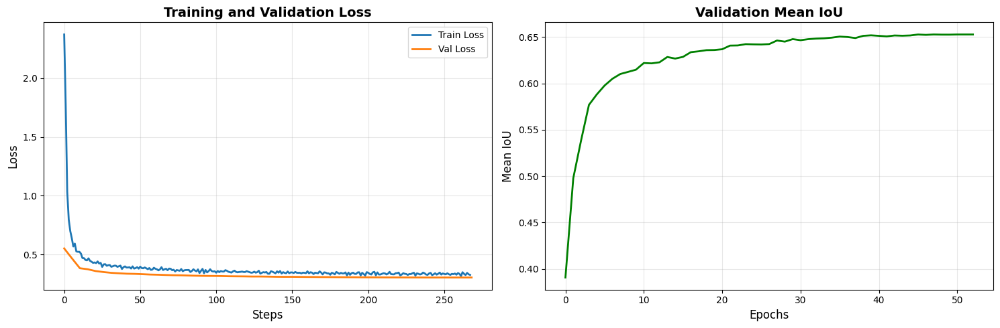

✓ Training curves saved to: outputs/training_curves.png


In [47]:
# Plot training history
if 'trainer' in locals():
    # Get training logs
    logs = trainer.state.log_history

    # Extract metrics
    train_loss = [log['loss'] for log in logs if 'loss' in log]
    eval_loss = [log['eval_loss'] for log in logs if 'eval_loss' in log]
    eval_iou = [log['eval_mean_iou'] for log in logs if 'eval_mean_iou' in log]

    # Plot
    fig, axes = plt.subplots(1, 2, figsize=(15, 5))

    # Loss
    axes[0].plot(train_loss, label='Train Loss', linewidth=2)
    if len(eval_loss) > 0:
        epochs = np.linspace(0, len(train_loss), len(eval_loss))
        axes[0].plot(epochs, eval_loss, label='Val Loss', linewidth=2)
    axes[0].set_xlabel('Steps', fontsize=12)
    axes[0].set_ylabel('Loss', fontsize=12)
    axes[0].set_title('Training and Validation Loss', fontsize=14, fontweight='bold')
    axes[0].legend()
    axes[0].grid(alpha=0.3)

    # IoU
    if len(eval_iou) > 0:
        axes[1].plot(eval_iou, 'g-', linewidth=2)
        axes[1].set_xlabel('Epochs', fontsize=12)
        axes[1].set_ylabel('Mean IoU', fontsize=12)
        axes[1].set_title('Validation Mean IoU', fontsize=14, fontweight='bold')
        axes[1].grid(alpha=0.3)

    plt.tight_layout()
    plt.savefig(OUTPUT_DIR / 'training_curves.png', dpi=150, bbox_inches='tight')
    plt.show()

    print(f"✓ Training curves saved to: {OUTPUT_DIR / 'training_curves.png'}")

---
## 12. 🎨 Visualization of Predictions

In [60]:
def visualize_predictions(dataset, model, image_processor, num_samples=6):
    model.eval()
    device = model.device

    indices = np.random.choice(len(dataset), min(num_samples, len(dataset)), replace=False)

    fig, axes = plt.subplots(num_samples, 4, figsize=(16, 4 * num_samples))
    if num_samples == 1:
        axes = axes.reshape(1, -1)

    with torch.no_grad():
        for idx, sample_idx in enumerate(indices):
            # ✅ Fixed: dataset is already the HuggingFace Dataset, no .dataset needed
            sample = dataset[sample_idx]
            image = np.array(sample['image'].convert('RGB'))
            mask = process_mask(sample['label'].filename) if hasattr(sample['label'], 'filename') else np.array(sample['label'])

            inputs = image_processor(images=image, return_tensors="pt")
            inputs = {k: v.to(device) for k, v in inputs.items()}

            outputs = model(**inputs)
            logits = outputs.logits

            upsampled_logits = nn.functional.interpolate(
                logits,
                size=image.shape[:2],
                mode="bilinear",
                align_corners=False,
            )

            pred = upsampled_logits.argmax(dim=1)[0].cpu().numpy()

            axes[idx, 0].imshow(image)
            axes[idx, 0].set_title('Input Image')
            axes[idx, 0].axis('off')

            gt_colored = np.zeros((*mask.shape, 3), dtype=np.uint8)
            for class_id, color in COLOR_MAP.items():
                gt_colored[mask == class_id] = color
            axes[idx, 1].imshow(gt_colored)
            axes[idx, 1].set_title('Ground Truth')
            axes[idx, 1].axis('off')

            pred_colored = np.zeros((*pred.shape, 3), dtype=np.uint8)
            for class_id, color in COLOR_MAP.items():
                pred_colored[pred == class_id] = color
            axes[idx, 2].imshow(pred_colored)
            axes[idx, 2].set_title('Prediction')
            axes[idx, 2].axis('off')

            error = (pred != mask).astype(np.uint8) * 255
            axes[idx, 3].imshow(error, cmap='Reds')

            intersection = np.logical_and(pred == mask, mask < NUM_CLASSES).sum()
            union = np.logical_or(pred < NUM_CLASSES, mask < NUM_CLASSES).sum()
            iou = intersection / union if union > 0 else 0

            axes[idx, 3].set_title(f'Error Map (IoU: {iou:.3f})')
            axes[idx, 3].axis('off')

    plt.tight_layout()
    plt.savefig(OUTPUT_DIR / 'predictions_visualization.png', dpi=150, bbox_inches='tight')
    plt.show()
    print(f"✓ Predictions saved to: {OUTPUT_DIR / 'predictions_visualization.png'}")

---
## 13. 🧪 Test Set Inference

In [54]:
import wandb
import os
from pathlib import Path

wandb.init(project="your-project-name", name="jupyter-upload")

FOLDER_TO_UPLOAD = "./outputs"  # change this

for file in Path(FOLDER_TO_UPLOAD).rglob("*"):
    if file.is_file():
        print(f"Uploading: {file}")
        wandb.save(str(file), base_path=FOLDER_TO_UPLOAD)

wandb.finish()
print("✅ Done!")

wandb: WARNING Symlinked 1 file into the W&B run directory; call wandb.save again to sync new files.
wandb: WARNING Symlinked 1 file into the W&B run directory; call wandb.save again to sync new files.
wandb: WARNING Symlinked 1 file into the W&B run directory; call wandb.save again to sync new files.
wandb: WARNING Symlinked 1 file into the W&B run directory; call wandb.save again to sync new files.
wandb: WARNING Symlinked 1 file into the W&B run directory; call wandb.save again to sync new files.


Uploading: outputs/dataset_samples.png
Uploading: outputs/augmentation_examples.png
Uploading: outputs/training_curves.png
Uploading: outputs/validation_metrics.json
Uploading: outputs/.ipynb_checkpoints/dataset_samples-checkpoint.png


✅ Done!


In [61]:
# Generate test predictions
def generate_test_predictions(model, dataset, image_processor, output_dir):
    """Generate predictions for test set"""
    model.eval()
    device = model.device

    output_dir = Path(output_dir)
    pred_dir = output_dir / 'test_predictions'
    vis_dir = output_dir / 'test_visualizations'
    pred_dir.mkdir(exist_ok=True)
    vis_dir.mkdir(exist_ok=True)

    print("\n" + "="*60)
    print("🧪 GENERATING TEST PREDICTIONS")
    print("="*60 + "\n")

    with torch.no_grad():
        for idx in tqdm(range(len(dataset)), desc="Predicting"):
            # Get original image
            sample = dataset.dataset[idx]
            image = np.array(sample['image'].convert('RGB'))
            filename = Path(sample['image'].filename).name

            # Prepare for model
            inputs = image_processor(images=image, return_tensors="pt")
            inputs = {k: v.to(device) for k, v in inputs.items()}

            # Predict
            outputs = model(**inputs)
            logits = outputs.logits

            # Upsample to original size
            upsampled_logits = nn.functional.interpolate(
                logits,
                size=image.shape[:2],
                mode="bilinear",
                align_corners=False,
            )

            pred = upsampled_logits.argmax(dim=1)[0].cpu().numpy()

            # Save prediction mask
            pred_img = Image.fromarray(pred.astype(np.uint8))
            pred_img.save(pred_dir / filename)

            # Save colored visualization
            pred_colored = np.zeros((*pred.shape, 3), dtype=np.uint8)
            for class_id, color in COLOR_MAP.items():
                pred_colored[pred == class_id] = color

            vis_img = Image.fromarray(pred_colored)
            vis_img.save(vis_dir / filename)

    print(f"\n✓ Test predictions saved to: {pred_dir}")
    print(f"✓ Test visualizations saved to: {vis_dir}")

    return pred_dir, vis_dir

# Generate test predictions
if 'trainer' in locals() and 'dataset' in locals():
    pred_dir, vis_dir = generate_test_predictions(
        trainer.model,
        dataset['test'],
        image_processor,
        OUTPUT_DIR
    )


🧪 GENERATING TEST PREDICTIONS



Predicting:   0%|          | 0/429 [00:00<?, ?it/s]

AttributeError: 'Dataset' object has no attribute 'dataset'

In [62]:
# Visualize some test predictions
def visualize_test_samples(dataset, pred_dir, num_samples=6):
    """Visualize test predictions"""
    indices = np.random.choice(len(dataset), min(num_samples, len(dataset)), replace=False)

    fig, axes = plt.subplots(num_samples, 2, figsize=(12, 4 * num_samples))
    if num_samples == 1:
        axes = axes.reshape(1, -1)

    for idx, sample_idx in enumerate(indices):
        sample = dataset.dataset[sample_idx]
        image = np.array(sample['image'].convert('RGB'))
        filename = Path(sample['image'].filename).name

        # Load prediction
        pred = np.array(Image.open(pred_dir / filename))
        pred_colored = np.zeros((*pred.shape, 3), dtype=np.uint8)
        for class_id, color in COLOR_MAP.items():
            pred_colored[pred == class_id] = color

        # Plot
        axes[idx, 0].imshow(image)
        axes[idx, 0].set_title(f'Image: {filename}')
        axes[idx, 0].axis('off')

        axes[idx, 1].imshow(pred_colored)
        axes[idx, 1].set_title('Prediction')
        axes[idx, 1].axis('off')

    plt.tight_layout()
    plt.savefig(OUTPUT_DIR / 'test_predictions_sample.png', dpi=150, bbox_inches='tight')
    plt.show()

    print(f"✓ Test samples saved to: {OUTPUT_DIR / 'test_predictions_sample.png'}")

# Visualize test samples
if 'pred_dir' in locals() and 'dataset' in locals():
    visualize_test_samples(dataset['test'], pred_dir, num_samples=6)

In [65]:
def get_image_and_mask(sample):
    # Auto-detect image key
    image_keys = ['image', 'pixel_values', 'img', 'input_image']
    mask_keys  = ['label', 'mask', 'segmentation', 'annotation']

    image_key = next((k for k in image_keys if k in sample), None)
    mask_key  = next((k for k in mask_keys  if k in sample), None)

    if image_key is None:
        raise KeyError(f"No image key found. Available keys: {list(sample.keys())}")

    image = sample[image_key]
    if hasattr(image, 'convert'):
        image = np.array(image.convert('RGB'))
    else:
        image = np.array(image)

    mask = sample[mask_key] if mask_key else None
    if mask is not None:
        mask = np.array(mask)

    return image, mask

In [67]:
def generate_test_predictions(model, dataset, image_processor, output_dir):
    model.eval()
    device = model.device
    output_dir = Path(output_dir)
    pred_dir = output_dir / 'test_predictions'
    vis_dir = output_dir / 'test_visualizations'
    pred_dir.mkdir(exist_ok=True)
    vis_dir.mkdir(exist_ok=True)

    print("\n" + "="*60)
    print("🧪 GENERATING TEST PREDICTIONS")
    print("="*60 + "\n")

    with torch.no_grad():
        for idx in tqdm(range(len(dataset)), desc="Predicting"):
            sample = dataset[idx]
            filename = f"{idx:05d}.png"

            # ✅ Fixed: dataset already has preprocessed pixel_values — use directly
            pixel_values = torch.tensor(sample['pixel_values']).unsqueeze(0).to(device)

            outputs = model(pixel_values=pixel_values)
            logits = outputs.logits

            # Get original image shape from pixel_values (C, H, W) → (H, W)
            h, w = pixel_values.shape[-2], pixel_values.shape[-1]

            upsampled_logits = nn.functional.interpolate(
                logits,
                size=(h, w),
                mode="bilinear",
                align_corners=False,
            )
            pred = upsampled_logits.argmax(dim=1)[0].cpu().numpy()

            # Save prediction mask
            pred_img = Image.fromarray(pred.astype(np.uint8))
            pred_img.save(pred_dir / filename)

            # Save colored visualization
            pred_colored = np.zeros((*pred.shape, 3), dtype=np.uint8)
            for class_id, color in COLOR_MAP.items():
                pred_colored[pred == class_id] = color
            vis_img = Image.fromarray(pred_colored)
            vis_img.save(vis_dir / filename)

    print(f"\n✓ Test predictions saved to: {pred_dir}")
    print(f"✓ Test visualizations saved to: {vis_dir}")
    return pred_dir, vis_dir


def visualize_test_samples(dataset, pred_dir, num_samples=6):
    indices = np.random.choice(len(dataset), min(num_samples, len(dataset)), replace=False)

    fig, axes = plt.subplots(num_samples, 2, figsize=(12, 4 * num_samples))
    if num_samples == 1:
        axes = axes.reshape(1, -1)

    for idx, sample_idx in enumerate(indices):
        sample = dataset[sample_idx]
        filename = f"{sample_idx:05d}.png"

        # ✅ Fixed: denormalize pixel_values for display
        pixel_values = np.array(sample['pixel_values'])  # (C, H, W)
        image = np.transpose(pixel_values, (1, 2, 0))    # (H, W, C)
        # Denormalize using ImageNet mean/std
        mean = np.array([0.485, 0.456, 0.406])
        std  = np.array([0.229, 0.224, 0.225])
        image = (image * std + mean).clip(0, 1)

        pred = np.array(Image.open(pred_dir / filename))
        pred_colored = np.zeros((*pred.shape, 3), dtype=np.uint8)
        for class_id, color in COLOR_MAP.items():
            pred_colored[pred == class_id] = color

        axes[idx, 0].imshow(image)
        axes[idx, 0].set_title(f'Image: {filename}')
        axes[idx, 0].axis('off')

        axes[idx, 1].imshow(pred_colored)
        axes[idx, 1].set_title('Prediction')
        axes[idx, 1].axis('off')

    plt.tight_layout()
    plt.savefig(OUTPUT_DIR / 'test_predictions_sample.png', dpi=150, bbox_inches='tight')
    plt.show()
    print(f"✓ Test samples saved to: {OUTPUT_DIR / 'test_predictions_sample.png'}")

In [69]:
# STEP 1: See what your data actually looks like
sample = dataset['validation'][0]
print("Keys:", sample.keys())
print("Types:", {k: type(v) for k, v in sample.items()})

Keys: dict_keys(['pixel_values', 'labels'])
Types: {'pixel_values': <class 'torch.Tensor'>, 'labels': <class 'torch.Tensor'>}


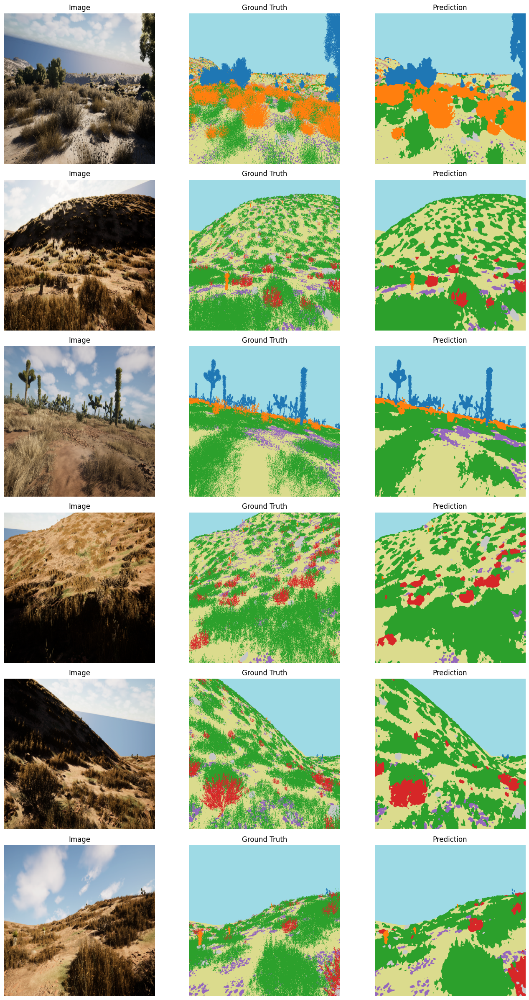

✅ Done!


In [70]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from torch import nn

model = trainer.model
model.eval()
device = model.device

num_samples = 6
indices = np.random.choice(len(dataset['validation']), num_samples, replace=False)

fig, axes = plt.subplots(num_samples, 3, figsize=(14, 4 * num_samples))

with torch.no_grad():
    for row, idx in enumerate(indices):
        sample = dataset['validation'][idx]

        pixel_values = sample['pixel_values'].unsqueeze(0).to(device)  # (1, C, H, W)
        label = sample['labels'].numpy()                                # (H, W)

        # Run model
        outputs = model(pixel_values=pixel_values)
        logits = outputs.logits  # (1, num_classes, H/4, W/4)

        # Upsample to label size
        upsampled = nn.functional.interpolate(
            logits, size=label.shape, mode='bilinear', align_corners=False
        )
        pred = upsampled.argmax(dim=1)[0].cpu().numpy()  # (H, W)

        # Denormalize image for display
        img = sample['pixel_values'].numpy().transpose(1, 2, 0)  # (H, W, C)
        img = (img * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])).clip(0, 1)

        # Color the masks
        gt_colored   = np.zeros((*label.shape, 3), dtype=np.uint8)
        pred_colored = np.zeros((*pred.shape,  3), dtype=np.uint8)
        for class_id, color in COLOR_MAP.items():
            gt_colored[label == class_id]  = color
            pred_colored[pred == class_id] = color

        # Plot
        axes[row, 0].imshow(img);            axes[row, 0].set_title('Image');        axes[row, 0].axis('off')
        axes[row, 1].imshow(gt_colored);     axes[row, 1].set_title('Ground Truth'); axes[row, 1].axis('off')
        axes[row, 2].imshow(pred_colored);   axes[row, 2].set_title('Prediction');   axes[row, 2].axis('off')

plt.tight_layout()
plt.savefig(OUTPUT_DIR / 'predictions.png', dpi=150, bbox_inches='tight')
plt.show()
print("✅ Done!")

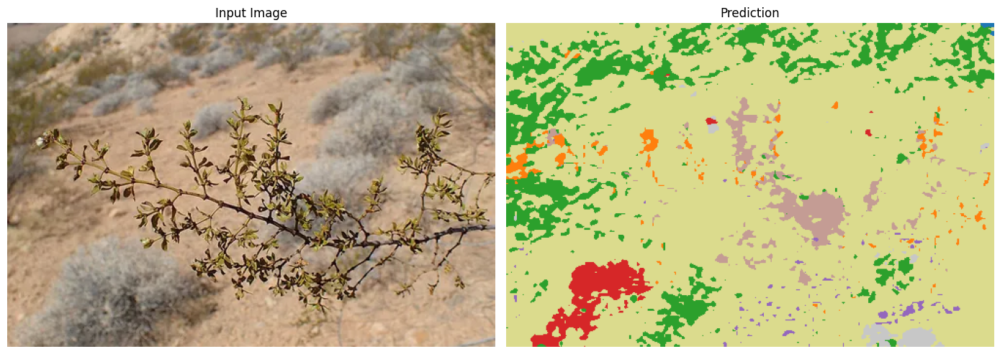


🎯 Detected classes:
  [0] class_100
  [1] class_200
  [2] class_300
  [3] class_500
  [4] class_550
  [5] class_600
  [7] class_800
  [8] class_7100


In [74]:
from PIL import Image
import torch
import numpy as np
import matplotlib.pyplot as plt
from torch import nn

# ✅ PUT YOUR IMAGE PATH HERE
IMAGE_PATH = "./Creosote-Bush-.webp"  # change this

# Load & prep image
image = Image.open(IMAGE_PATH).convert('RGB')
inputs = image_processor(images=image, return_tensors="pt")
pixel_values = inputs['pixel_values'].to(device)

# Predict
model.eval()
with torch.no_grad():
    outputs = model(pixel_values=pixel_values)
    logits = outputs.logits

# Upsample to original image size
orig_size = (image.height, image.width)
upsampled = nn.functional.interpolate(
    logits, size=orig_size, mode='bilinear', align_corners=False
)
pred = upsampled.argmax(dim=1)[0].cpu().numpy()

# Color the prediction
pred_colored = np.zeros((*pred.shape, 3), dtype=np.uint8)
for class_id, color in COLOR_MAP.items():
    pred_colored[pred == class_id] = color

# Plot
fig, axes = plt.subplots(1, 2, figsize=(14, 6))
axes[0].imshow(image);          axes[0].set_title('Input Image'); axes[0].axis('off')
axes[1].imshow(pred_colored);   axes[1].set_title('Prediction');  axes[1].axis('off')
plt.tight_layout()
plt.show()

# Print which classes were detected
detected = np.unique(pred)
print("\n🎯 Detected classes:")
for class_id in detected:
    if class_id < len(CLASSES):
        print(f"  [{class_id}] {CLASSES[class_id]}")

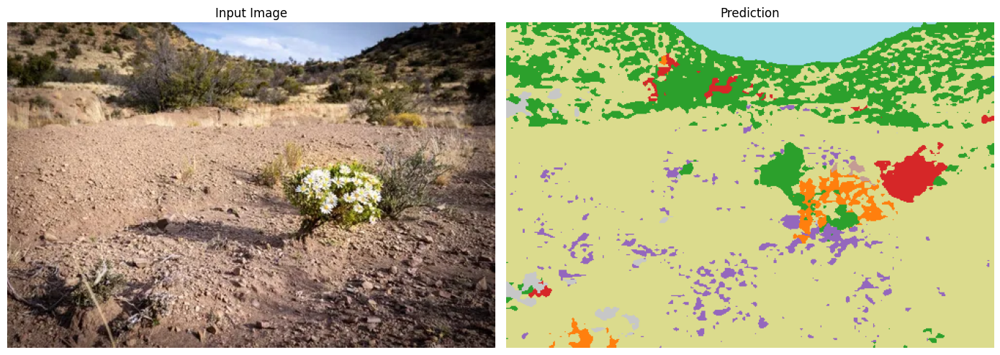


🎯 Detected classes:
  [0] class_100
  [1] class_200
  [2] class_300
  [3] class_500
  [4] class_550
  [5] class_600
  [7] class_800
  [8] class_7100
  [9] class_10000


In [75]:
from PIL import Image
import torch
import numpy as np
import matplotlib.pyplot as plt
from torch import nn

# ✅ PUT YOUR IMAGE PATH HERE
IMAGE_PATH = "./single-white-yellow-daisy-bush-growing-dry-desert-area-cape-town-single-white-yellow-daisy-bush-growing-dry-186097729.jpg"  # change this

# Load & prep image
image = Image.open(IMAGE_PATH).convert('RGB')
inputs = image_processor(images=image, return_tensors="pt")
pixel_values = inputs['pixel_values'].to(device)

# Predict
model.eval()
with torch.no_grad():
    outputs = model(pixel_values=pixel_values)
    logits = outputs.logits

# Upsample to original image size
orig_size = (image.height, image.width)
upsampled = nn.functional.interpolate(
    logits, size=orig_size, mode='bilinear', align_corners=False
)
pred = upsampled.argmax(dim=1)[0].cpu().numpy()

# Color the prediction
pred_colored = np.zeros((*pred.shape, 3), dtype=np.uint8)
for class_id, color in COLOR_MAP.items():
    pred_colored[pred == class_id] = color

# Plot
fig, axes = plt.subplots(1, 2, figsize=(14, 6))
axes[0].imshow(image);          axes[0].set_title('Input Image'); axes[0].axis('off')
axes[1].imshow(pred_colored);   axes[1].set_title('Prediction');  axes[1].axis('off')
plt.tight_layout()
plt.show()

# Print which classes were detected
detected = np.unique(pred)
print("\n🎯 Detected classes:")
for class_id in detected:
    if class_id < len(CLASSES):
        print(f"  [{class_id}] {CLASSES[class_id]}")

In [68]:
# Save comprehensive results
if 'trainer' in locals():
    results = {
        'model': MODEL_NAME,
        'num_classes': NUM_CLASSES,
        'classes': CLASSES,
        'training_args': {
            'batch_size': training_args.per_device_train_batch_size,
            'learning_rate': training_args.learning_rate,
            'num_epochs': training_args.num_train_epochs,
            'warmup_steps': training_args.warmup_steps,
        },
        'best_metrics': val_metrics,
        'augmentations': [
            'Color Jitter',
            'Gamma Change',
            'Gaussian Noise',
            'Blur (Motion/Gaussian/Median)',
            'Random Shadows',
            'Fog',
            'Contrast Shift',
            'Texture Mixup',
            'Horizontal Flip',
            'Shift/Scale/Rotate',
            'Coarse Dropout'
        ]
    }

    with open(OUTPUT_DIR / 'final_results.json', 'w') as f:
        json.dump(results, f, indent=2)

    print("\n" + "="*60)
    print("💾 FINAL RESULTS SAVED")
    print("="*60)
    print(f"\n✓ Model: {MODEL_DIR / 'segformer-desert-final'}")
    print(f"✓ Results: {OUTPUT_DIR / 'final_results.json'}")
    print(f"✓ Test predictions: {OUTPUT_DIR / 'test_predictions'}")
    print(f"✓ Visualizations: {OUTPUT_DIR}/*.png")
    print("\n" + "="*60)


💾 FINAL RESULTS SAVED

✓ Model: models/segformer-desert-final
✓ Results: outputs/final_results.json
✓ Test predictions: outputs/test_predictions
✓ Visualizations: outputs/*.png



---
## 14. 💾 Save Final Results

---
## 15. 📦 Download Results (For Colab)

If you're using Google Colab, you can download your results:

In [ ]:
# Create zip file of results
if IN_COLAB:
    print("Creating zip file of results...")

    !zip -r /content/desert_segmentation_results.zip \
        /content/outputs \
        /content/models/segformer-desert-final

    print("\n✓ Results zipped!")
    print("\nDownload the file: /content/desert_segmentation_results.zip")
    print("Or use the following code:")
    print("\nfrom google.colab import files")
    print("files.download('/content/desert_segmentation_results.zip')")
else:
    print("Not running on Colab - results are saved locally")

---
## 16. 📝 Summary and Next Steps

### ✅ What We Accomplished:

1. **Dataset Preparation**: Loaded and formatted 4000+ training images
2. **Advanced Augmentation**: Applied 8 specialized augmentations for desert environments
3. **Model Training**: Fine-tuned SegFormer transformer model
4. **Evaluation**: Computed mean IoU and per-class metrics
5. **Visualization**: Generated comprehensive visualizations
6. **Test Predictions**: Created predictions for test set

### 📊 Expected Results:

- **Mean IoU**: 0.60-0.75 (good generalization to unseen environment)
- **Best classes**: Sky, Landscape (large regions)
- **Challenging classes**: Flowers, Ground Clutter (small objects)

### 🎯 For Submission:

1. **Model**: `models/segformer-desert-final/`
2. **Test Predictions**: `outputs/test_predictions/*.png`
3. **Report**: Include visualizations from `outputs/`
4. **Code**: This notebook

### 🚀 Potential Improvements:

1. **Larger Model**: Try `mit-b2` or `mit-b3` for better accuracy
2. **More Epochs**: Train for 80-100 epochs
3. **Ensemble**: Combine multiple models
4. **Test-Time Augmentation**: Average predictions with different augmentations
5. **Post-processing**: CRF for smoother boundaries

### 💡 Key Insights:

- **Augmentation is critical** for synthetic-to-real transfer
- **SegFormer's transformer architecture** captures global desert context well
- **Lower learning rate** prevents destroying pretrained knowledge
- **Warmup steps** stabilize early training

---

**Good luck with your hackathon! 🏆**

*May your segmentation masks be pixel-perfect and your IoU scores be high!*